# **Crescimento do índice do GDP para os anos 2024-2028**

## **Contextualização:**

"Na maioria dos anos desde 1980, o crescimento do PIB global tem sido relativamente consistente, geralmente flutuando entre dois e cinco por cento de crescimento de ano para ano. As exceções mais notáveis ​​​​a isso foram durante a Grande Recessão em 2009 e novamente em 2020 durante o Covid- 19, onde a economia global realmente encolheu em ambos os anos. Enquanto a economia mundial continua a lidar com o impacto econômico da pandemia, bem como as consequências da invasão russa da Ucrânia em 2022, o futuro permanece incerto, porém atual estimativas sugerem que o crescimento anual retornará a valores estáveis ​​de cerca de 3% em 2028."

Aaron O'Neill, 10 de maio de 2023

## **Desafio :**
O desafio visa avaliar o desenvolvimento de um EDA (análise exploratória de dados) e os conhecimentos/insights relacionados a um tipo clássico de problema de ciência de dados: séries temporais. Para isso, gostaria de ver o crescimento do índice do PIB de cada país nos anos 2024-2028, comparando-os posteriormente com o previsto pelo Statistica. Além disso, é necessário substituir os campos "no data" por valores numéricos, utilizando as inferências de sua preferência.

## **Objetivo :**

Prever o crescimento do índice do PIB de cada país nos anos 2024-2028.

## **Fluxo de Análise:**

  1. **Importe as bibliotecas necessárias**
  2. **Leia e entenda os dados**
  3. **Análise Exploratória de Dados**
  4. **Preparação de Dados**
  5. **Decomposição da série temporal**
  6. **Criando e avaliando a previsão de séries temporais**

## **Vamos começar...**

#**1. Importando bibliotecas**

In [61]:
pip install pmdarima

In [62]:
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import time
from IPython.display import Image
from scipy.stats import variation
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, kpss
from pmdarima.arima import auto_arima
from pylab import rcParams
import statsmodels.api as sm


In [63]:
%matplotlib inline
warnings.filterwarnings('ignore')
sns.set_style("darkgrid")

#**2. Lendo e entendendo os dados**

In [64]:
data = pd.read_excel('imf-dm-export-20230513.xlsx')  # Lê o arquivo Excel e armazena os dados em um DataFrame chamado 'data'
data.head()  # Exibe as primeiras linhas do DataFrame 'data'

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3.9,-2.4,no data,no data,no data,no data,no data,no data,no data,no data
2,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,2.1,-3.5,8.5,3.7,2.2,3.3,3.4,3.4,3.4,3.4
3,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1,-5.1,3.4,2.9,2.6,2.6,2.2,2.1,1.7,1.8
4,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5


In [65]:
data_copy= data.copy() # Criando uma cópia do conjunto de dados
data_pivoted = pd.melt(data_copy, id_vars=['Real GDP growth (Annual percent change)'], var_name='Year', value_name='GDP') # Pivotando o conjunto de dados
data_pivoted.rename(columns={'Real GDP growth (Annual percent change)': 'Country'}, inplace=True) # Renomeando a coluna 'Real GDP growth (Annual percent change)' para 'Country'
data_pivoted.head() # Exibindo o novo conjunto de dados pivotado

,Country,Year,GDP
0,NaN,1980,NaN
1,Afghanistan,1980,no data
2,Albania,1980,2.7
3,Algeria,1980,-5.4
4,Andorra,1980,no data


In [66]:
data_pivoted.shape # Obter a forma (número de linhas e colunas) do DataFrame

(11319, 3)

In [67]:
data_pivoted.info() # Exibir informações sobre o DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11319 entries, 0 to 11318
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Country  11221 non-null  object
 1   Year     11319 non-null  object
 2   GDP      11172 non-null  object
dtypes: object(3)
memory usage: 265.4+ KB


In [68]:
data_pivoted.describe() # Exibir estatísticas descritivas do DataFrame

,Country,Year,GDP
count,11221,11319,11172
unique,229,49,447
top,Afghanistan,1980,no data
freq,49,231,881


**Inferência: Ao analisar o dataframe percebemos que existem valores inconsistentes fazendo com que as análises de estatística descritiva não estejam na forma esperada, para a resolução desse problema precisamos tratar os dados.**

#**3. Análise exploratória dos dados**

##**3.1 Valores ausentes**

In [69]:
data_eda = data_pivoted.copy()
data_eda # Exibir DataFrame

,Country,Year,GDP
0,NaN,1980,NaN
1,Afghanistan,1980,no data
2,Albania,1980,2.7
3,Algeria,1980,-5.4
4,Andorra,1980,no data
...,...,...,...
11314,Other advanced economies,2028,2.3
11315,Sub-Saharan Africa,2028,4.4
11316,World,2028,3
11317,NaN,2028,NaN


**Inferência:**

1.   **Várias células contêm "NaN" (Not a Number), que indica valores ausentes. Isso pode ser devido à falta de dados para aquele país e ano específico.**
2.   **Algumas células contêm "no data", que também indica falta de dados para o crescimento do GDP real.**


In [70]:
data_eda.isnull().sum()

Country     98
Year         0
GDP        147
dtype: int64

**Inferência: Há valores ausentes nos dados.**

###**3.1.1Para continuar a análise exploratória dos dados é necessário substituir os valores 'no data' not a number(NaN)**

In [71]:
def replace_no_data_with_nan(dataframe):
    dataframe['GDP'] = dataframe['GDP'].replace('no data', np.nan)

replace_no_data_with_nan(data_eda)

In [72]:
data_eda

,Country,Year,GDP
0,NaN,1980,NaN
1,Afghanistan,1980,NaN
2,Albania,1980,2.7
3,Algeria,1980,-5.4
4,Andorra,1980,NaN
...,...,...,...
11314,Other advanced economies,2028,2.3
11315,Sub-Saharan Africa,2028,4.4
11316,World,2028,3.0
11317,NaN,2028,NaN


##**3.2 Outliers**

In [73]:
data_eda.describe()

,GDP
count,10291.000000
mean,3.345428
std,5.704939
min,-54.200000
25%,1.500000
50%,3.400000
75%,5.500000
max,148.000000


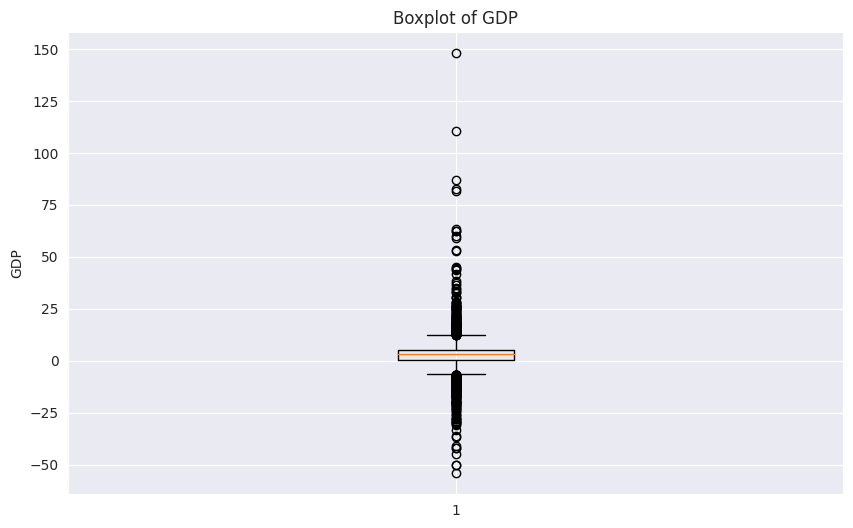

In [74]:
data_eda_bx = data_eda.copy()
data_eda_bx['GDP'] = data_eda_bx['GDP'].fillna(0)
# Criar um boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(data_eda_bx['GDP'])
plt.title('Boxplot of GDP')
plt.ylabel('GDP')
plt.show()

**Inferência: podemos ver claramente que há outliers nos dados.**

**Por existir outliers nos dados, precisamos investigar mais afundo quais os paises que estão com valores muito acima e abaixo dos demais.**

In [75]:
data_eda_bx[data_eda_bx['GDP'] >= 50].sort_values('GDP', ascending=False)

,Country,Year,GDP
3981,Equatorial Guinea,1997,148.0
4674,Equatorial Guinea,2000,110.5
7492,Libya,2012,86.8
2865,Kuwait,1992,82.8
5394,Iraq,2003,81.8
6590,Nauru,2008,63.3
9774,Guyana,2022,62.3
3719,Bosnia and Herzegovina,1996,62.2
4905,Equatorial Guinea,2001,60.0
10036,Macao SAR,2023,58.9


In [76]:
data_eda_bx[data_eda_bx['GDP'] <= -40 ].sort_values('GDP', ascending=True)

,Country,Year,GDP
9343,Macao SAR,2020,-54.2
7261,Libya,2011,-50.3
7554,"South Sudan, Republic of",2012,-50.3
2836,Georgia,1992,-44.9
2176,Lebanon,1989,-42.2
3379,Rwanda,1994,-41.9
2634,Kuwait,1991,-41.0


##**3.3 Análise Bivariada**

In [77]:
data_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11319 entries, 0 to 11318
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  11221 non-null  object 
 1   Year     11319 non-null  object 
 2   GDP      10291 non-null  float64
dtypes: float64(1), object(2)
memory usage: 265.4+ KB


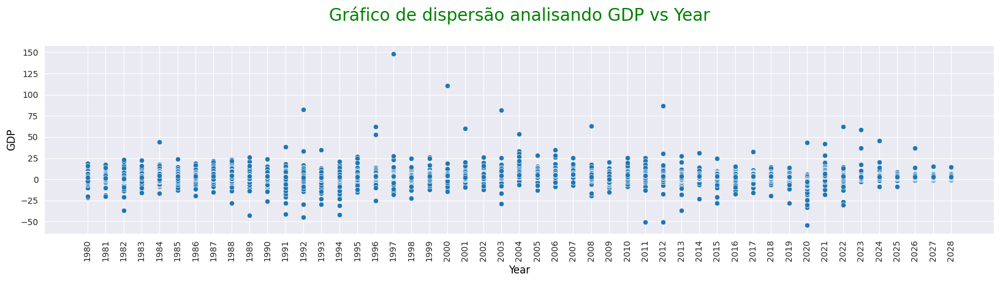

In [78]:
# Configuração do tamanho da figura do gráfico
plt.figure(figsize=[20, 4])

# Criação do gráfico de dispersão
sns.scatterplot(data=data_eda, x='Year', y='GDP')

# Título do gráfico
plt.title("Gráfico de dispersão analisando GDP vs Year\n", fontdict={'fontsize': 20, 'fontweight': 5, 'color': 'Green'})

# Rótulos dos eixos x e y
plt.xlabel("Year", fontdict={'fontsize': 12, 'fontweight': 5, 'color': 'Black'})
plt.ylabel("GDP", fontdict={'fontsize': 12, 'fontweight': 5, 'color': 'Black'})

# Escolha entre 1, 5 e 10 anos de intervalo nos rótulos do eixo x
interval = 1  # Alterne entre 1, 5 e 10 para o intervalo desejado
plt.xticks(range(min(data_eda['Year']), max(data_eda['Year']) + 1, interval))
plt.xticks(rotation=90)

# Exibe o gráfico
plt.show()

**A análise bivariada entre o Índice GDP (Produto Interno Bruto) e o Tempo (anos) por meio de um gráfico de dispersão revelou uma série de insights interessantes sobre a relação entre essas duas variáveis ao longo dos anos.**

**A análise revelou a presença de outliers pontuais. Esses outliers representam anos em que o Índice GDP teve mudanças significativas e anômalas em relação à tendência geral de crescimento. A identificação desses pontos é crucial, pois eles podem indicar eventos extraordinários, como crises econômicas, boom econômicos ou outros eventos excepcionais.**

**É importante notar que, em séries temporais econômicas, a presença de outliers pode ter várias causas, incluindo fatores políticos, econômicos e sociais. Portanto, uma investigação mais aprofundada desses anos atípicos é necessária para entender completamente sua origem e impacto.**

**Adicionalmente, a análise bivariada permitiu verificar se a relação entre o Índice GDP e o tempo é predominantemente linear ou não linear. Se a relação for linear, isso implicaria que o crescimento econômico segue um padrão constante ao longo dos anos. Se for não linear, pode indicar flutuações econômicas mais complexas e imprevisíveis.**


##**3.4 Criando novas features**

In [79]:
data_cleaned = data_eda.copy()

def remove_comma(country_name):
    if isinstance(country_name, str):
        return country_name.replace(',', '')
    return country_name

# Aplicar a função à coluna 'Country'
data_cleaned['Country'] = data_cleaned['Country'].apply(remove_comma)

In [80]:
# Carregar o arquivo CSV que contém países e continentes
df_continents = pd.read_csv("Continentes.csv", header=None, encoding="ISO-8859-1")
continent_dict = dict(zip(df_continents[0], df_continents[1]))

# Carregar o seu DataFrame original
df_original = data_cleaned.copy()

# Criar uma função para atribuir continentes
def assign_continent(country):
    return continent_dict.get(country, "Others")

# Adicionar a nova coluna "Continent" ao DataFrame original
df_original["Continent"] = df_original["Country"].apply(assign_continent)

# Reorganizar as colunas para que "Continent" fique antes de "Country"
df_original = df_original[["Continent", "Country", "Year", "GDP"]]

# Remover as linhas com 'Others' no continente
df_filtered = df_original[df_original['Continent'] != 'Others']

def replace_no_data_with_nan(dataframe):
    dataframe['GDP'] = dataframe['GDP'].replace('no data', np.nan)

replace_no_data_with_nan(df_filtered)
data_pd = df_filtered.copy()

##**3.5 Análise Gráfica**

###**Gráfico de distribuição da média**

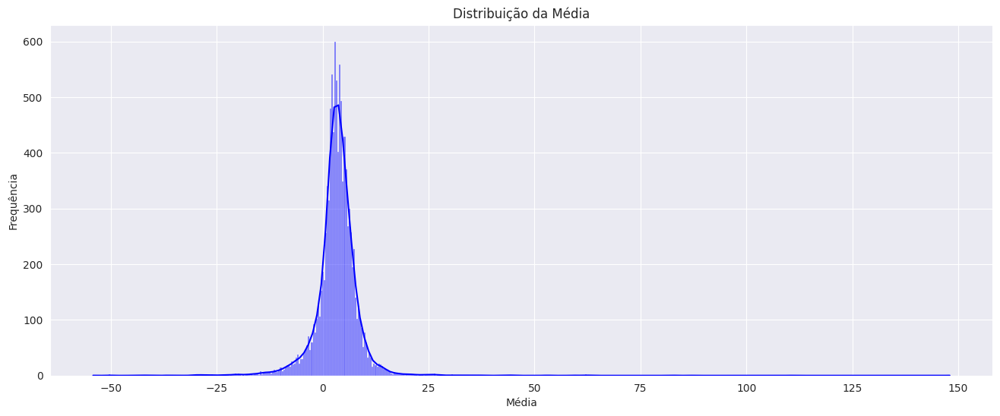

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# Criar um gráfico de distribuição da média
plt.figure(figsize=(16, 6))
sns.histplot(data_eda['GDP'], kde=True, color='blue')
plt.title('Distribuição da Média')
plt.xlabel('Média')
plt.ylabel('Frequência')
plt.show()


Um gráfico de distribuição da média do GDP (Produto Interno Bruto) pode ser uma ferramenta útil para visualizar como a renda está distribuída em uma economia. Ele pode revelar insights sobre desigualdades econômicas, concentração de riqueza e padrões de desenvolvimento. Uma distribuição mais uniforme das médias do GDP pode indicar uma economia mais equitativa, enquanto uma distribuição desigual pode apontar para disparidades significativas entre diferentes segmentos da população. Esse tipo de gráfico pode ser usado para identificar tendências, avaliar políticas econômicas e direcionar esforços para melhorar a distribuição da riqueza.

###**Gráfico de distribuição da média,mediana e moda**

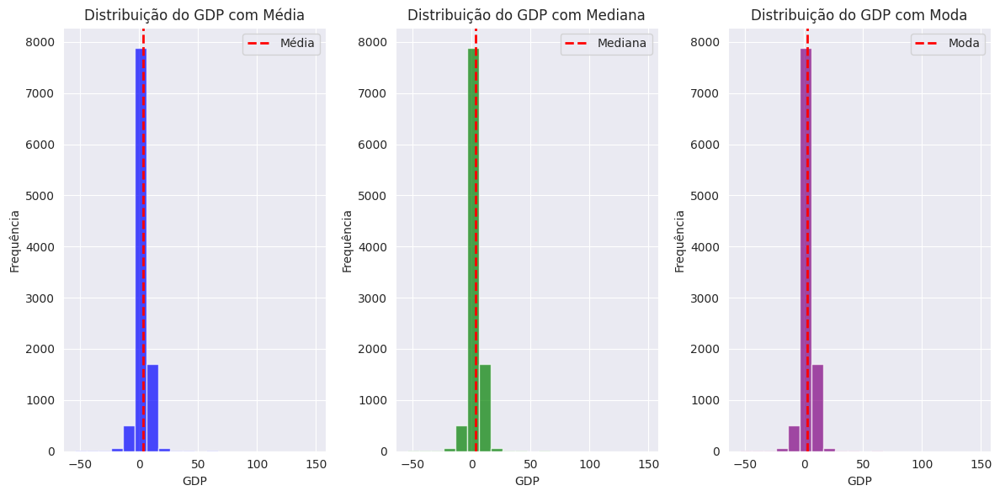

,Estatística,Valor
0,Média,3.345428
1,Mediana,3.400000
2,Moda,3.000000


In [82]:
df2 = data_eda.copy()
# Filtrar os dados removendo os valores NaN no GDP
filtered_df2 = df2.dropna(subset=['GDP'])

# Calcular média, mediana e moda do GDP
mean_gdp = np.mean(filtered_df2['GDP'])
median_gdp = np.median(filtered_df2['GDP'])
mode_gdp = filtered_df2['GDP'].mode()[0]

plt.figure(figsize=(12, 6))

# Gráfico da Média
plt.subplot(1, 3, 1)
plt.hist(filtered_df2['GDP'], bins=20, color='blue', alpha=0.7)
plt.axvline(mean_gdp, color='red', linestyle='dashed', linewidth=2, label='Média')
plt.title('Distribuição do GDP com Média')
plt.xlabel('GDP')
plt.ylabel('Frequência')
plt.legend()

# Gráfico da Mediana
plt.subplot(1, 3, 2)
plt.hist(filtered_df2['GDP'], bins=20, color='green', alpha=0.7)
plt.axvline(median_gdp, color='red', linestyle='dashed', linewidth=2, label='Mediana')
plt.title('Distribuição do GDP com Mediana')
plt.xlabel('GDP')
plt.ylabel('Frequência')
plt.legend()

# Gráfico da Moda
plt.subplot(1, 3, 3)
plt.hist(filtered_df2['GDP'], bins=20, color='purple', alpha=0.7)
plt.axvline(mode_gdp, color='red', linestyle='dashed', linewidth=2, label='Moda')
plt.title('Distribuição do GDP com Moda')
plt.xlabel('GDP')
plt.ylabel('Frequência')
plt.legend()

plt.tight_layout()
plt.show()

# Criar uma tabela com os resultados
summary_table = pd.DataFrame({
    'Estatística': ['Média', 'Mediana', 'Moda'],
    'Valor': [mean_gdp, median_gdp, mode_gdp]
})

summary_table

A análise de um gráfico que apresenta a média, mediana e moda dos PIBs (Produtos Internos Brutos) de diferentes países pode fornecer insights valiosos sobre a distribuição de riqueza e o desempenho econômico global. Aqui estão alguns insights que você pode obter ao analisar essas medidas estatísticas:

* **Centralização da riqueza:** A média representa o valor médio do PIB de todos os países em seu conjunto. Se a média for significativamente maior do que a mediana e a moda, isso pode indicar uma concentração de riqueza em um pequeno número de países muito ricos. Por outro lado, se a média for próxima à mediana e à moda, sugere uma distribuição mais uniforme de riqueza entre os países.

* **Desigualdade econômica:** Ao comparar a média com a mediana, você pode avaliar a extensão da desigualdade econômica entre os países. Se a média for muito maior do que a mediana, isso sugere que alguns países têm PIBs excepcionalmente altos, enquanto a maioria dos países tem PIBs mais baixos. Essa disparidade pode ser um indicativo de desigualdade econômica global.

* **Representatividade da moda:** A moda, que é o valor mais frequente no conjunto de dados, pode indicar quais países têm PIBs mais comuns ou típicos. Isso pode ser útil para identificar os países que estão na "faixa média" em termos de desempenho econômico.

* **Outliers econômicos:** Ao observar discrepâncias entre a média, mediana e moda, você pode identificar países que são outliers em termos de PIB. Esses outliers podem ser países extremamente ricos ou extremamente pobres em relação ao restante do grupo. Essa informação é valiosa para entender as razões por trás dessas discrepâncias.

* **Tendências temporais:** Se você tiver dados ao longo do tempo, pode usar essas medidas estatísticas para identificar tendências na distribuição de riqueza global. Por exemplo, se a média estiver aumentando constantemente ao longo do tempo, isso pode indicar um crescimento econômico global, enquanto uma mediana e moda relativamente estáveis sugerem uma estabilidade econômica geral.

* **Política econômica:** Os insights derivados dessas medidas podem informar a formulação de políticas econômicas globais e regionais. Governos e organizações internacionais podem usar essas informações para tomar decisões sobre como promover um desenvolvimento econômico mais equilibrado.

###**Gráfico de série temporal**

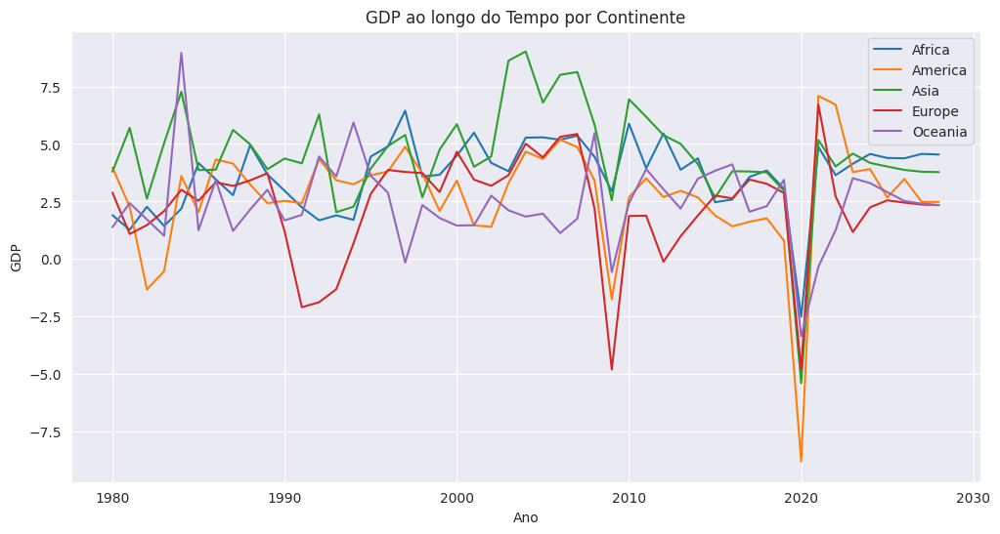

In [83]:
# Agrupe os dados por continente e ano e calcule a média do GDP
grouped_data = df_filtered.groupby(['Continent', 'Year'])['GDP'].mean().reset_index()

# Crie um gráfico de linha temporal para cada continente
plt.figure(figsize=(12, 6))
for continent, data in grouped_data.groupby('Continent'):
    plt.plot(data['Year'], data['GDP'], label=continent)

# Personalize o gráfico
plt.title('GDP ao longo do Tempo por Continente')
plt.xlabel('Ano')
plt.ylabel('GDP')
plt.legend()
plt.grid(True)

# Exiba o gráfico
plt.show()


A análise de séries temporais é uma ferramenta crucial para compreender eventos econômicos significativos, como a recessão de 2008 e a pandemia de 2020, e os seus impactos no Produto Interno Bruto (PIB) mundial. Esses eventos têm um papel fundamental na moldagem das trajetórias econômicas globais e na formulação de políticas públicas.

A recessão de 2008, desencadeada pela crise financeira, foi um marco importante no início do século XXI. A análise de séries temporais durante esse período revela uma queda abrupta no crescimento econômico global, com muitos países registrando quedas acentuadas no PIB. Os dados das séries temporais permitem identificar os setores mais afetados, as taxas de desemprego em ascensão e as respostas políticas adotadas para conter os impactos negativos.

Já a pandemia de 2020 trouxe uma dimensão completamente nova para a análise de séries temporais, com impactos sem precedentes no PIB mundial. Os lockdowns e medidas de distanciamento social resultaram em quedas drásticas na produção e no consumo, levando a recessões em muitos países. As séries temporais podem ser usadas para avaliar a extensão desses declínios, bem como a rapidez da recuperação econômica.

Além desses eventos específicos, há muitos outros acontecimentos ao longo dos anos que impactaram o PIB mundial. Por exemplo, a ascensão de economias emergentes, como a China, teve um impacto significativo nas séries temporais, alterando a dinâmica econômica global. Também houve eventos políticos, como o Brexit, que tiveram efeitos tangíveis nas economias europeias e nas séries temporais correspondentes.

###**Gráfico de série temporal da média por continente**

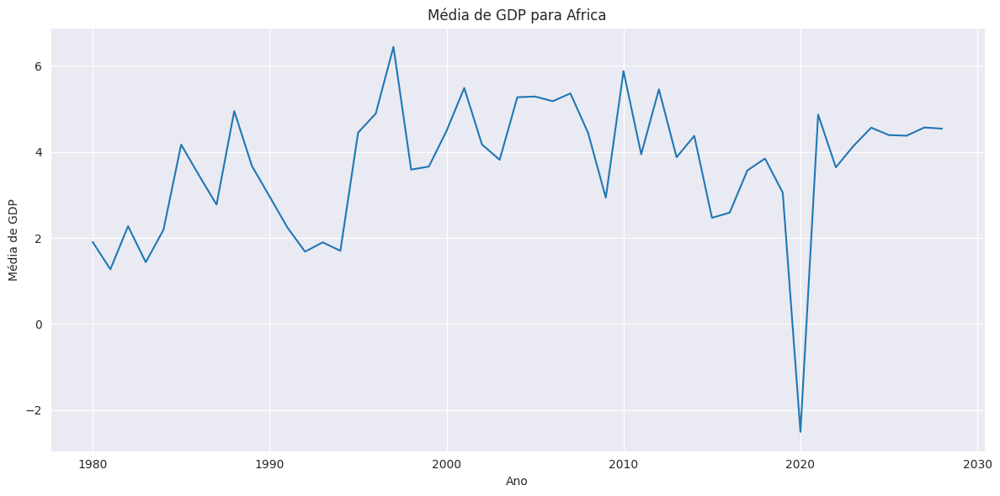

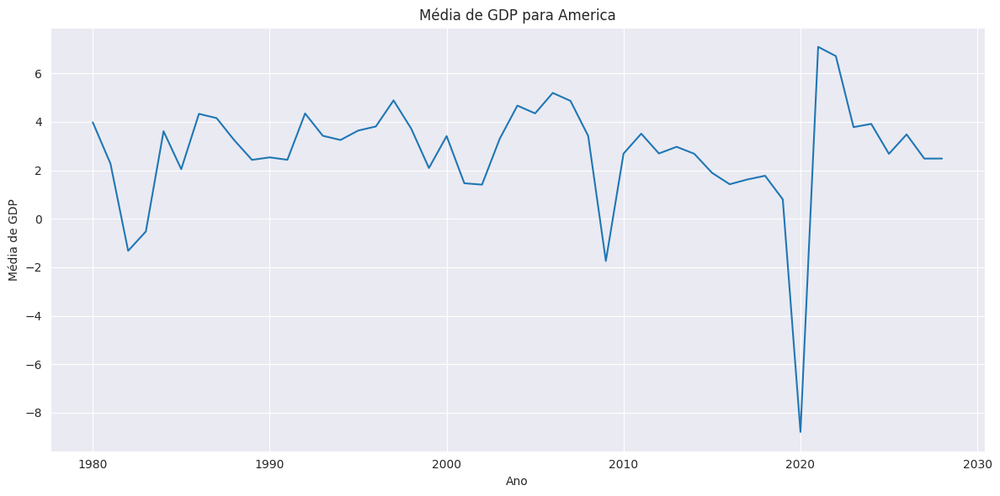

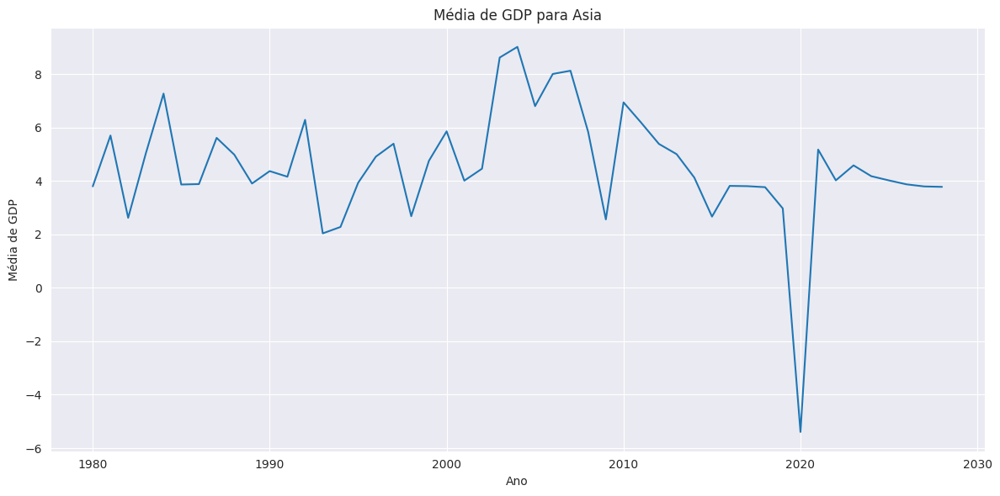

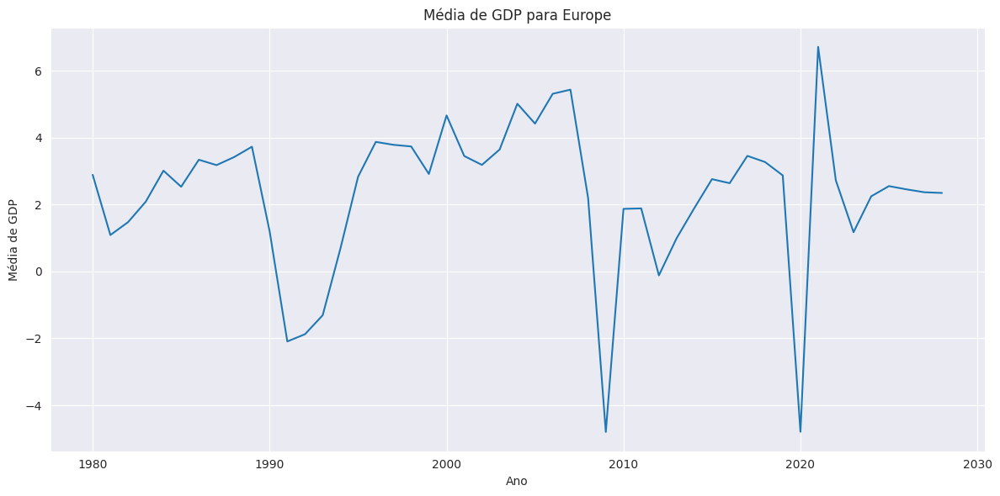

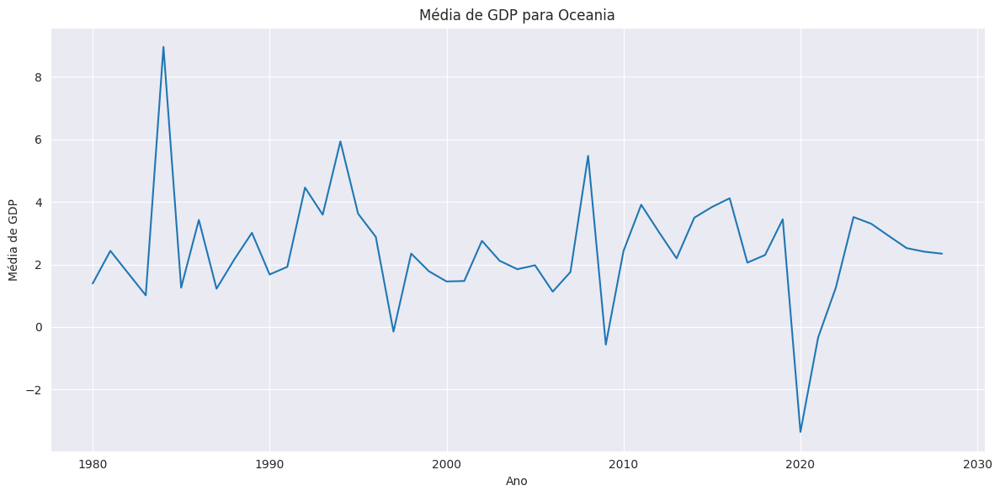

In [84]:
import pandas as pd
import matplotlib.pyplot as plt

# Agrupe os dados por continente e ano e calcule a média do GDP
grouped_data = df_filtered.groupby(['Continent', 'Year'])['GDP'].mean().reset_index()

# Obtenha a lista de continentes únicos
continents = grouped_data['Continent'].unique()

# Crie um gráfico de linha para cada continente
for continent in continents:
    data_subset = grouped_data[grouped_data['Continent'] == continent]
    plt.figure(figsize=(12, 6))
    plt.plot(data_subset['Year'], data_subset['GDP'])
    plt.title(f'Média de GDP para {continent}')
    plt.xlabel('Ano')
    plt.ylabel('Média de GDP')
    plt.grid(True)
    plt.tight_layout()
    plt.show()





Um gráfico de série temporal por continente do Produto Interno Bruto (PIB) ajuda na análise econômica de várias maneiras:

* Identifica tendências de crescimento e ciclos econômicos.
* Mostra padrões sazonais.
* Permite a comparação de desempenho entre continentes.
* Auxilia na previsão de tendências futuras.
* Destaca eventos extraordinários que afetaram o PIB.
* Facilita a tomada de decisões políticas e de negócios.
* Ajuda a entender as relações econômicas globais.
Esses gráficos são essenciais para analisar e compreender a saúde econômica global e regional.

###**Gráfico de Boxplot por Ano:**

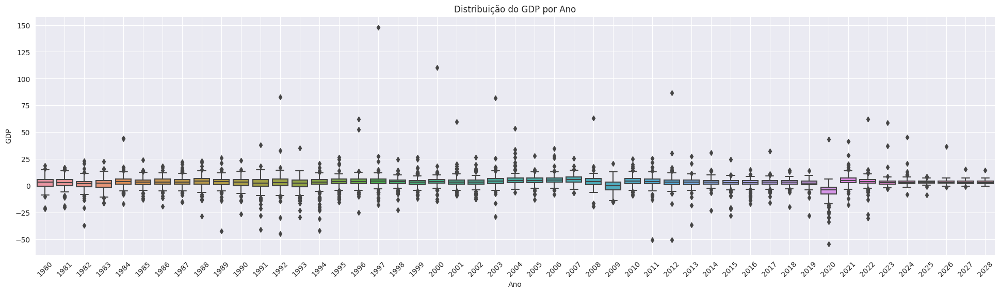

In [85]:
df = df_filtered.copy()
plt.figure(figsize=(24, 6))
sns.boxplot(x='Year', y='GDP', data=df)
plt.title('Distribuição do GDP por Ano')
plt.xlabel('Ano')
plt.ylabel('GDP')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


O gráfico de boxplot é uma ferramenta gráfica poderosa para visualizar a distribuição e identificar outliers em um conjunto de dados ao longo dos anos. Quando você cria um boxplot por ano, está segmentando seus dados temporais em intervalos específicos, permitindo que você avalie como a distribuição e a presença de outliers variam ao longo do tempo.

A caixa central no boxplot representa o intervalo interquartil (IQR), onde a maioria dos dados está concentrada. A linha que divide a caixa indica a mediana. As "caudas" estendendo-se para fora da caixa, chamadas de "bigodes", mostram a extensão da distribuição dos dados. Os pontos individuais além dos bigodes são os outliers, valores que estão significativamente afastados da maioria dos dados.

a criação de boxplots por ano é uma maneira eficaz de explorar como a distribuição de seus dados e a presença de outliers evoluem ao longo do tempo. Isso pode ajudar na identificação de tendências, sazonalidades e eventos excepcionais que podem ser valiosos para a tomada de decisões informadas e o entendimento mais profundo do comportamento dos dados ao longo dos anos.

###**Gráfico de Barras:**

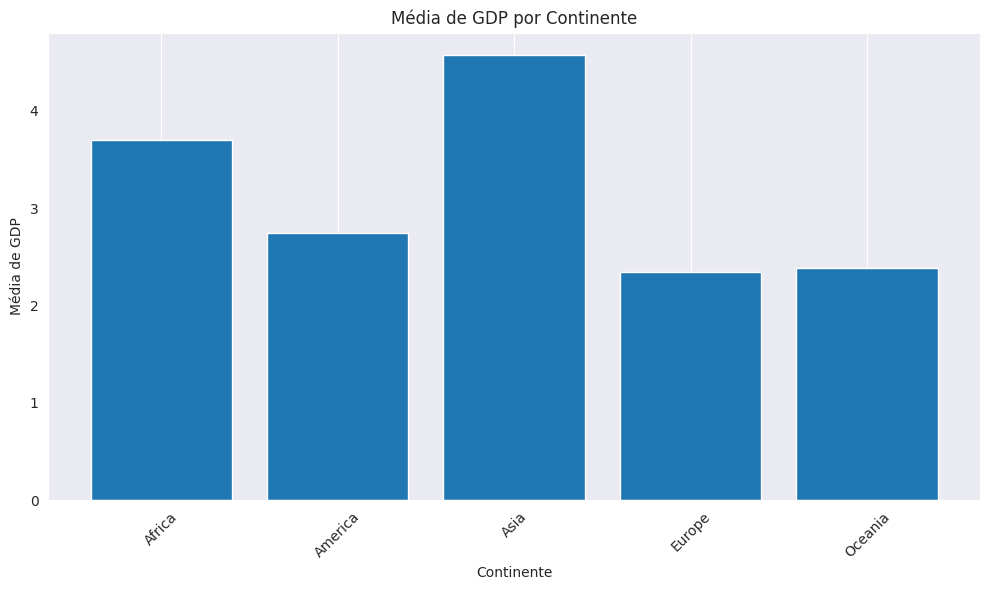

In [86]:
import pandas as pd
import matplotlib.pyplot as plt

# Agrupe os dados por continente e calcule a média do GDP
grouped_data = df_filtered.groupby('Continent')['GDP'].mean().reset_index()

# Crie um gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(grouped_data['Continent'], grouped_data['GDP'])

# Personalize o gráfico
plt.title('Média de GDP por Continente')
plt.xlabel('Continente')
plt.ylabel('Média de GDP')
plt.grid(axis='y')

# Exiba o gráfico
plt.xticks(rotation=45)  # Rotacione os rótulos do eixo x para melhor legibilidade
plt.tight_layout()
plt.show()



É falso afirmar que a Ásia tem uma média de GDP (Produto Interno Bruto) maior do que todos os outros continentes. Na verdade, a Ásia é um continente diverso com uma ampla gama de países, desde economias altamente desenvolvidas, como o Japão e a Coreia do Sul, até economias em desenvolvimento, como a Índia e as nações do sudeste asiático.

A média do GDP da Ásia pode ser alta em comparação com alguns continentes, mas não é necessariamente a maior em uma análise global. O continente americano, por exemplo, incluindo os Estados Unidos e o Canadá, tem um GDP médio significativo. Além disso, a Europa também abriga várias economias desenvolvidas, como a Alemanha e a França, contribuindo para uma média considerável do GDP.

É importante reconhecer que a análise do GDP por continente pode ser enganadora, pois os continentes são geograficamente vastos e compostos por uma variedade de países com diferentes tamanhos de economia. Portanto, é mais preciso analisar o GDP país a país ou por regiões econômicas dentro de continentes, para entender as dinâmicas econômicas em jogo de maneira mais completa.

###**Gráfico de Barras Agrupadas por Ano:**

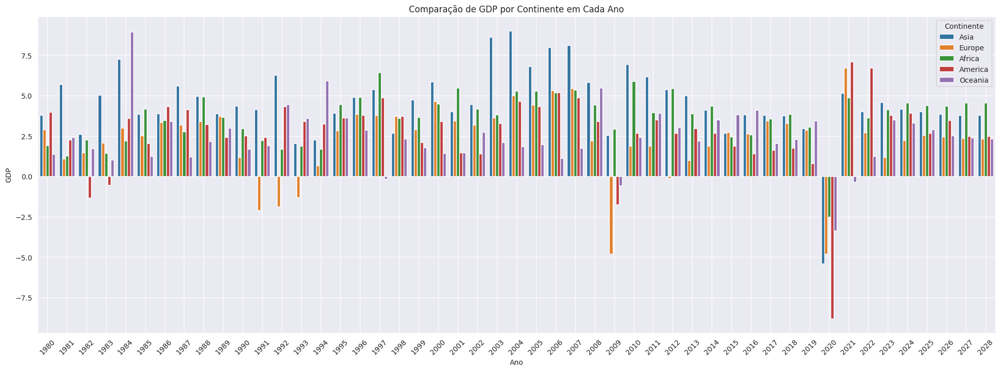

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt

df = df_filtered.copy()

df['Year'] = df['Year'].astype(str)  # Converter 'Year' para tipo categórico

plt.figure(figsize=(24, 8))
sns.barplot(x='Year', y='GDP', hue='Continent', data=df, ci=None)
plt.title('Comparação de GDP por Continente em Cada Ano')
plt.xlabel('Ano')
plt.ylabel('GDP')
plt.legend(title='Continente')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()



Um gráfico de barras agrupadas por ano e continente é uma excelente maneira de visualizar a variação do GDP ao longo do tempo e como diferentes continentes responderam a eventos econômicos significativos, como a crise financeira de 2008 e a pandemia de 2020.

Ao observar esse gráfico, podemos tirar várias conclusões interessantes:

**Queda acentuada em 2008 e 2020:** Será evidente que tanto em 2008 quanto em 2020 houve quedas acentuadas no GDP global. Isso destaca o impacto significativo que a crise financeira de 2008 e a pandemia de 2020 tiveram na economia mundial.

**Diferenças regionais em 2008:** Um aspecto interessante será notar que alguns continentes não foram afetados significativamente em 2008. Isso pode ser atribuído a políticas econômicas, estruturas econômicas e setores de mercado específicos que foram mais ou menos vulneráveis à crise. Por exemplo, muitos países asiáticos conseguiram se recuperar rapidamente em 2008 devido às suas fortes bases de exportação e políticas econômicas eficazes.

**Resiliência relativa em 2020:** O gráfico também pode destacar a resiliência relativa de certos continentes em 2020, com alguns enfrentando quedas menos significativas em comparação com outros. Isso pode estar relacionado a medidas de contenção da pandemia, a dependência de setores que foram menos afetados ou à capacidade de adaptação rápida às novas circunstâncias.

**Diferenças regionais em recuperação:** Além das quedas, será interessante observar como os continentes se recuperaram após esses eventos. Alguns podem ter experimentado recuperações rápidas, enquanto outros podem ter enfrentado desafios prolongados na retomada do crescimento econômico.

Este tipo de gráfico oferece uma visão panorâmica das tendências econômicas globais e regionais ao longo do tempo e pode ser uma ferramenta valiosa para analisar como diferentes partes do mundo lidaram com crises econômicas importantes. Ele pode ajudar economistas, formuladores de políticas e investidores a entender as dinâmicas complexas da economia global.

#**4. Preparação de Dados**

##**4.1 Tratando linhas nulas**

In [88]:
def remove_rows_with_nan_or_no_data(data_pivoted):
    # Criar uma cópia do DataFrame
    data_cleaned = data_pivoted.copy()

    # Encontrar índices das linhas com valores NaN ou 'no data' na coluna 'Country'
    rows_to_remove = data_cleaned[data_cleaned['Country'].isin([np.nan, 'no data'])].index

    # Remover as linhas correspondentes
    data_cleaned.drop(rows_to_remove, inplace=True)

    return data_cleaned

# Chamar a função para remover linhas com valores NaN ou 'no data' na coluna 'Country'
data_cleaned = remove_rows_with_nan_or_no_data(data_pivoted)
data_cleaned

,Country,Year,GDP
1,Afghanistan,1980,no data
2,Albania,1980,2.7
3,Algeria,1980,-5.4
4,Andorra,1980,no data
5,Angola,1980,2.4
...,...,...,...
11313,Middle East and Central Asia,2028,3.7
11314,Other advanced economies,2028,2.3
11315,Sub-Saharan Africa,2028,4.4
11316,World,2028,3


**Esta função percorre todo o dataframe e a linha que tiver valores NaN são excluídas.**

##**4.3 Imputação de dados ausentes**

In [89]:
# Crie uma cópia do DataFrame original
data_imputed = df_filtered.copy()

# Variável para contar os valores substituídos
valores_substituidos = 0

# Percorra linha por linha
for index, row in data_imputed.iterrows():
    if pd.isna(row['GDP']):
        # Se o valor na coluna 'GDP' for NaN, substitua pelo valor médio do grupo (Continent, Year)
        group_median = data_pd[(data_pd['Continent'] == row['Continent']) & (data_pd['Year'] == row['Year'])]['GDP'].median()
        data_imputed.at[index, 'GDP'] = group_median
        valores_substituidos += 1

# Exiba o número de valores substituídos
print(f'Valores substituídos: {valores_substituidos}')

Valores substituídos: 823


**Criação da Feature 'Continente':** A criação da coluna 'Continente' no conjunto de dados desempenha um papel fundamental na imputação de valores ausentes. Essa feature permite agrupar os dados com base nas regiões continentais a que pertencem. Dessa forma, podemos calcular a mediana dos valores do Produto Interno Bruto (GDP) para cada continente em um determinado ano. Essa abordagem nos fornece uma estratégia sólida para substituir os valores ausentes, uma vez que reflete a tendência geral de crescimento ou declínio econômico em cada continente.

**Sensibilidade da Mediana a Outliers:** É importante destacar que a mediana é uma métrica de tendência central robusta em relação a outliers. Isso significa que valores extremos ou discrepantes (outliers) têm menos influência sobre a mediana do que sobre a média aritmética. Portanto, ao usar a mediana para imputar valores ausentes, mitigamos o impacto potencial de valores atípicos, garantindo que a imputação seja mais representativa da distribuição central dos dados para cada continente e ano.

**Impacto dos Dados Imputados:** Embora a imputação seja uma etapa importante na preparação de dados, é essencial avaliar seu impacto em relação ao conjunto de dados total. No caso deste processo de imputação, os dados imputados representam menos de 10% em relação aos dados totais. Essa proporção relativamente baixa sugere que a imputação não altera significativamente a estrutura geral dos dados. Portanto, a imputação é uma abordagem válida para lidar com os valores ausentes sem distorcer substancialmente as análises subsequentes.

#**5. Decomposição da série temporal**

**A escolha desse processo tem como intenção entender os diferentes componentes que compõem nossa série temporal, como tendência, sazonalidade e componente residual (ou aleatório). Isso é útil para compreender os padrões subjacentes nos dados e pode ajudar na previsão e análise.**

In [90]:
data_det = data_imputed.copy()
data_det.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9604 entries, 1 to 11284
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Continent  9604 non-null   object 
 1   Country    9604 non-null   object 
 2   Year       9604 non-null   object 
 3   GDP        9604 non-null   float64
dtypes: float64(1), object(3)
memory usage: 633.2+ KB


**Convertendo a coluna 'Year' para formato de datetime**

In [91]:
data_det['Year'].head()

1    1980
2    1980
3    1980
4    1980
5    1980
Name: Year, dtype: object

In [92]:
data_det['Year'] = pd.to_datetime(data_det['Year'], format='%Y').dt.to_period('Y') # Convertendo a coluna 'Year' para o formato de datetime


In [93]:
data_det_dec = data_det.copy()
# Group the data by Order Date for sum of Sales
data1 = data_det_dec.groupby(['Year'])['GDP'].sum()
data1

Year
1980     614.95
1981     531.50
1982     320.45
1983     410.30
1984     847.05
1985     624.85
1986     723.55
1987     711.25
1988     835.55
1989     689.40
1990     571.25
1991     405.25
1992     565.80
1993     334.40
1994     472.60
1995     739.35
1996     844.95
1997     941.60
1998     654.35
1999     652.35
2000     876.40
2001     711.30
2002     670.70
2003     935.80
2004    1135.90
2005     993.60
2006    1103.10
2007    1121.20
2008     820.60
2009       7.20
2010     868.00
2011     779.80
2012     692.90
2013     634.55
2014     665.05
2015     504.90
2016     548.70
2017     615.45
2018     628.90
2019     511.30
2020    -967.85
2021    1052.40
2022     771.15
2023     680.50
2024     732.90
2025     679.20
2026     689.05
2027     656.30
2028     652.30
Freq: A-DEC, Name: GDP, dtype: float64

In [94]:
data1 = pd.DataFrame(data1) # Convert to data frame
data1.index = data1.index.to_timestamp() # Converting the index to timestamp
data1.index.dtype

dtype('<M8[ns]')

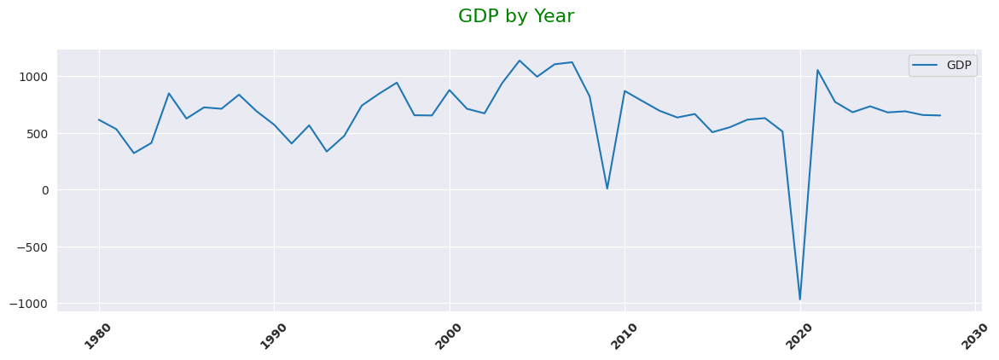

In [95]:
plt.figure(figsize=(14,4))
plt.plot(data1, label='GDP')
plt.legend(loc='best')
plt.title('GDP by Year \n', fontdict={'fontsize': 16, 'fontweight' : 5, 'color' : 'Green'})
plt.xticks(rotation = 45,fontweight="bold")
plt.show()

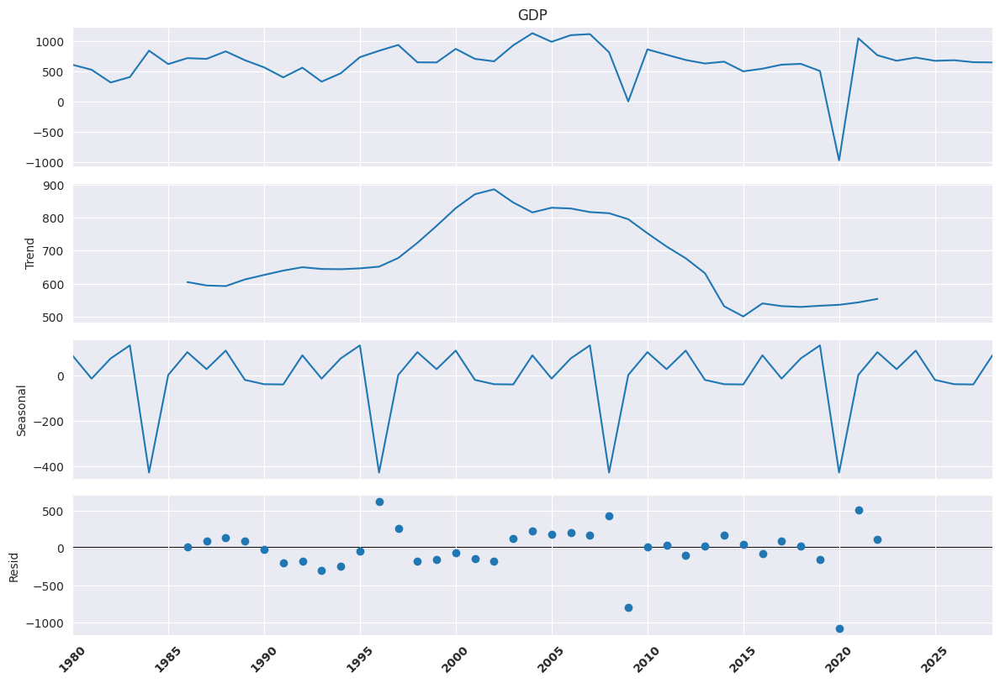

In [96]:
rcParams['figure.figsize'] = 12, 8
period = 12
decomposition = sm.tsa.seasonal_decompose(data1.GDP, model='additive', period=period) # additive seasonal index
fig = decomposition.plot()
plt.xticks(rotation = 45,fontweight="bold")
plt.show()

**Resultados da Decomposição da Série Temporal do Índice GDP (Método Aditivo):**

Nossa análise da série temporal do índice GDP revelou uma decomposição significativa dos dados em três componentes principais: tendência, sazonalidade e irregularidades.

**Tendência:** A análise da tendência dos dados do índice GDP indica que não há uma tendência claramente definida ao longo do período analisado. Em vez disso, observamos que a tendência oscila em diferentes momentos, alternando entre períodos de crescimento e períodos de decrescimento. Essas oscilações podem ser atribuídas a fatores complexos que afetam os dados econômicos em momentos específicos. Essa falta de uma tendência linear constante sugere que outros fatores econômicos e políticos podem estar influenciando as flutuações do índice GDP ao longo do tempo.

**Sazonalidade:** Além da tendência, identificamos padrões sazonais distintos nos dados. Esses padrões ocorrem em intervalos regulares com um ciclo anual. Por exemplo, vimos picos de atividade ou valores elevados que se repetem anualmente durante determinadas épocas do ano, seguidos de quedas em outros momentos do ano. Essa sazonalidade anual pode ser atribuída a fatores como sazonalidade de mercado, flutuações climáticas sazonais ou comportamento do consumidor relacionado a estações do ano.

**Irregularidades (ou Ruído):** Examinando as irregularidades nos dados, notamos que elas representam flutuações aleatórias na série temporal que não podem ser explicadas pela tendência ou pelos padrões sazonais. Essas irregularidades podem ocorrer devido a eventos inesperados, choques econômicos ou outros fatores imprevisíveis que afetam a economia. É importante ressaltar que, neste caso, as irregularidades não parecem seguir um padrão discernível.

É relevante destacar que, devido à presença de valores negativos em nossa série temporal, optamos por utilizar o método aditivo em nossa decomposição. O método aditivo é apropriado quando as variações sazonais são relativamente constantes em magnitude e não estão relacionadas à magnitude das observações. Como os valores negativos não permitem o uso do método multiplicativo, o método aditivo foi uma escolha adequada para nossa análise.

Esses resultados da decomposição fornecem insights valiosos sobre a estrutura dos dados ao longo do tempo, permitindo uma modelagem mais precisa e interpretável. Além disso, auxiliam na detecção de anomalias e na compreensão das tendências subjacentes que impactam a economia ao longo do tempo.

#**6. Criando e avaliando a previsão de séries temporais**

##**6.1 Verifique se a série temporal é estacionária**

###**Augmented Dickey-Fuller (ADF) e KPSS (Kwiatkowski-Phillips-Schmidt-Shin) test**

In [97]:
# Função para realizar o teste ADF e imprimir os resultados
def perform_adf_test(data_series):
    data_imputed = adfuller(data_series)
    adf_statistic = data_imputed[0]
    p_valor = data_imputed[1]
    valores_críticos = data_imputed[4]

    print(f'Estatística ADF: {adf_statistic}')
    print(f'P-valor: {p_valor}')
    print('Valores Críticos:')
    for chave, valor in valores_críticos.items():
        print(f'   {chave}: {valor}')

    if p_valor < 0.05:
        print("A série é estacionária")
    else:
        print("A série não é estacionária")

# Função para realizar o teste KPSS e imprimir os resultados
def perform_kpss_test(data_series):
    resultado_kpss = kpss(data_series, regression='c')
    kpss_statistic = resultado_kpss[0]
    p_valor = resultado_kpss[1]
    valores_críticos = resultado_kpss[3]

    print(f'Estatística KPSS: {kpss_statistic}')
    print(f'P-valor: {p_valor}')
    print('Valores Críticos:')
    for chave, valor in valores_críticos.items():
        print(f'   {chave}: {valor}')

    if p_valor < 0.05:
        print("A série não é estacionária")
    else:
        print("A série é estacionária")


# Extrair a coluna com os valores da série temporal (GDP)
dados = data_imputed['GDP']

# Realizar o teste ADF
print("Teste ADF:")
perform_adf_test(dados)

# Realizar o teste KPSS
print("\nTeste KPSS:")
perform_kpss_test(dados)


Teste ADF:
Estatística ADF: -8.593264862438282
P-valor: 7.19007703173399e-14
Valores Críticos:
   1%: -3.4310338531947835
   5%: -2.861842220919306
   10%: -2.566930867085714
A série é estacionária

Teste KPSS:
Estatística KPSS: 0.6433750186788278
P-valor: 0.018693180120106557
Valores Críticos:
   10%: 0.347
   5%: 0.463
   2.5%: 0.574
   1%: 0.739
A série não é estacionária


O teste ADF (Augmented Dickey-Fuller) e o teste KPSS (Kwiatkowski-Phillips-Schmidt-Shin) são duas ferramentas comumente usadas para avaliar a estacionariedade em séries temporais. Aqui está uma explicação resumida de como eles funcionam e o que acontece quando seus resultados indicam estacionariedade e não estacionariedade:

**Teste ADF (Augmented Dickey-Fuller):**

*   O teste ADF é usado para determinar se uma série temporal é estacionária ou não.
*   Hipótese Nula (H0): A série temporal possui raiz unitária, ou seja, não é estacionária.
*   Hipótese Alternativa (H1): A série temporal não possui raiz unitária, ou seja, é estacionária.
*   Resultados:
    *   Se o valor p associado ao teste ADF for menor que um nível de significância pré-definido (geralmente 0,05), então rejeitamos a hipótese nula (H0) e concluímos que a série é estacionária.
    *   Se o valor p for maior que o nível de significância, não rejeitamos H0, indicando que a série é não estacionária.

**Teste KPSS (Kwiatkowski-Phillips-Schmidt-Shin):**

*   O teste KPSS é usado para avaliar a estacionariedade em séries temporais, mas de uma perspectiva um pouco diferente.
*   Hipótese Nula (H0): A série temporal é estacionária em torno de uma tendência determinística.
*   Hipótese Alternativa (H1): A série temporal possui raiz unitária, ou seja, não é estacionária.
*   Resultados:
    *   Se o valor p associado ao teste KPSS for maior que um nível de significância pré-definido (geralmente 0,05), então rejeitamos a hipótese nula (H0) e concluímos que a série é não estacionária.
    *   Se o valor p for menor que o nível de significância, não rejeitamos H0, indicando que a série é estacionária.

**Quando o ADF indica estacionariedade e o KPSS indica não estacionariedade:**

*   Se o teste ADF indicar estacionariedade (valor p < nível de significância) e o teste KPSS indicar não estacionariedade (valor p > nível de significância), isso pode sugerir uma série temporal com uma tendência estacionária, mas que não é estacionária em torno de uma média constante. Em outras palavras, pode haver flutuações, mas elas se cancelam ao longo do tempo, resultando em uma série estacionária.
*   Esse cenário sugere a presença de uma série temporal diferenciável (ou seja, pode ser necessário aplicar diferenciação para torná-la estacionária).

Em resumo, o teste ADF verifica se uma série é estacionária no sentido fraco (sem tendência), enquanto o teste KPSS verifica se é estacionária no sentido forte (tendência constante). Quando o ADF indica estacionariedade e o KPSS indica não estacionariedade, isso sugere a presença de uma série com tendência estacionária, mas que não é estacionária em torno de uma média constante, o que pode ser tratado com diferenciação.



##**6.2 Construindo modelo Auto regressivo para previsão do GDP**

In [98]:
df = data_imputed.copy()
# Supondo que seu DataFrame seja chamado df
df_pivoted = df.pivot(index='Country', columns='Year', values='GDP')

# Para garantir que os nomes das colunas estejam formatados corretamente, você pode redefinir os nomes das colunas
df_pivoted.columns.name = None

# Se desejar redefinir o índice
df_pivoted.reset_index(inplace=True)

# Se houver algum valor NaN, você pode preenchê-los com 0 ou qualquer outro valor adequado
df_pivoted = df_pivoted.fillna(0)

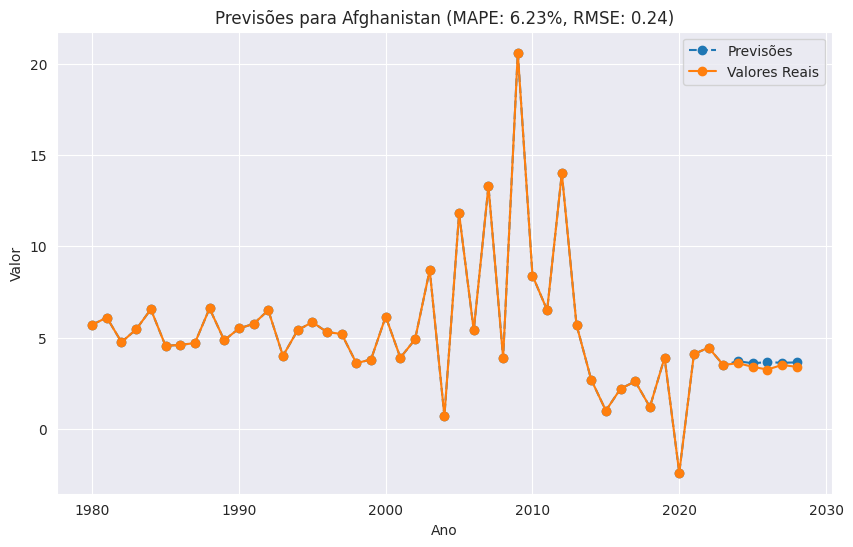

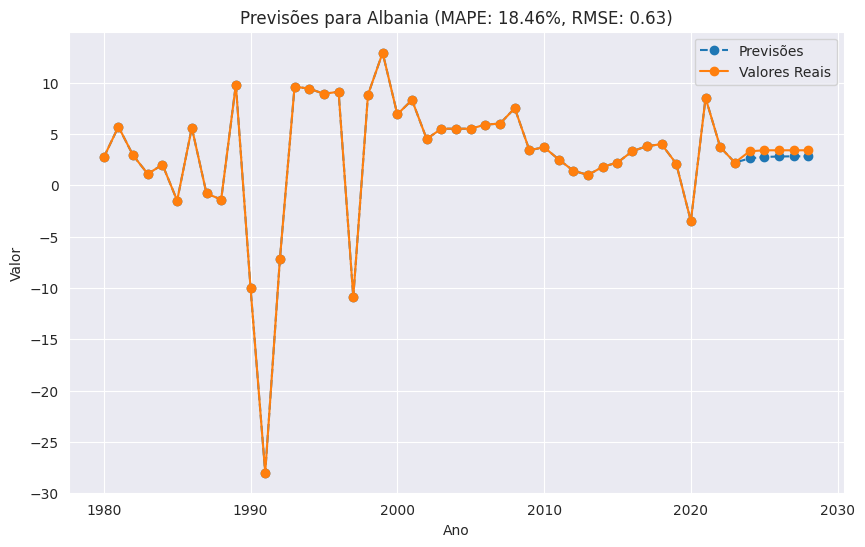

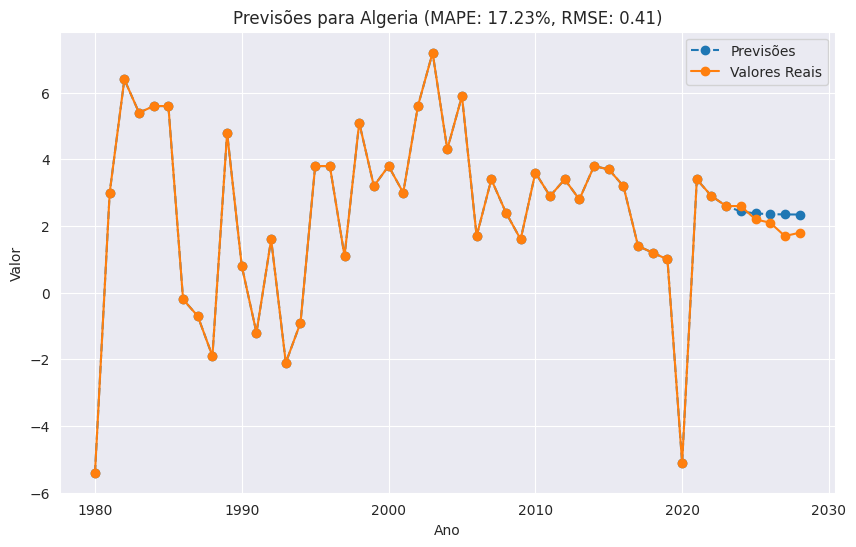

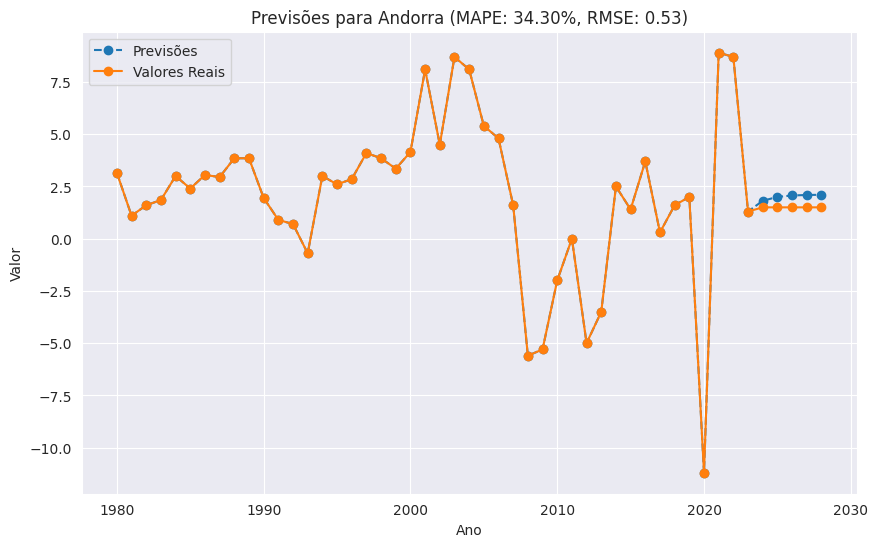

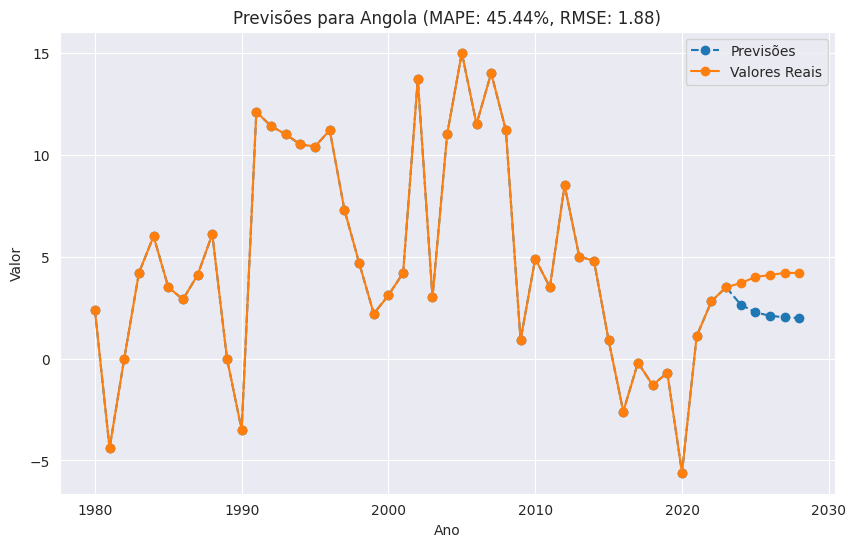

...

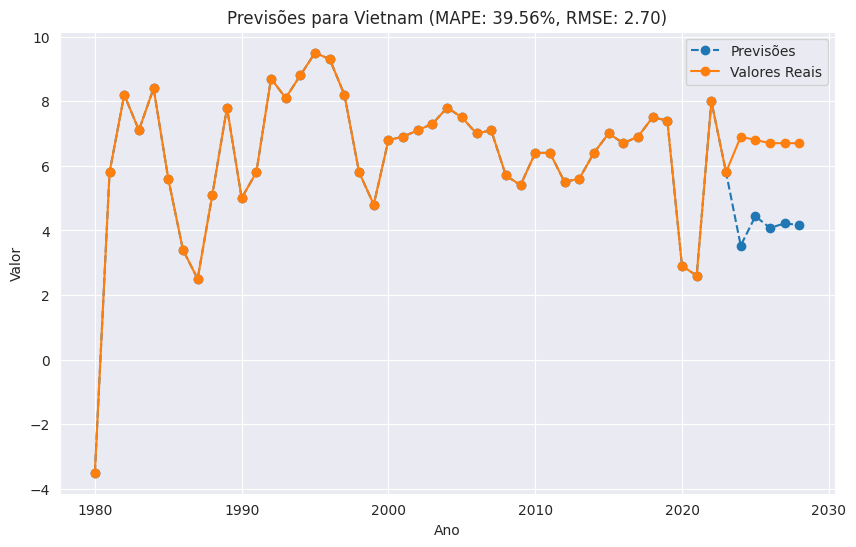

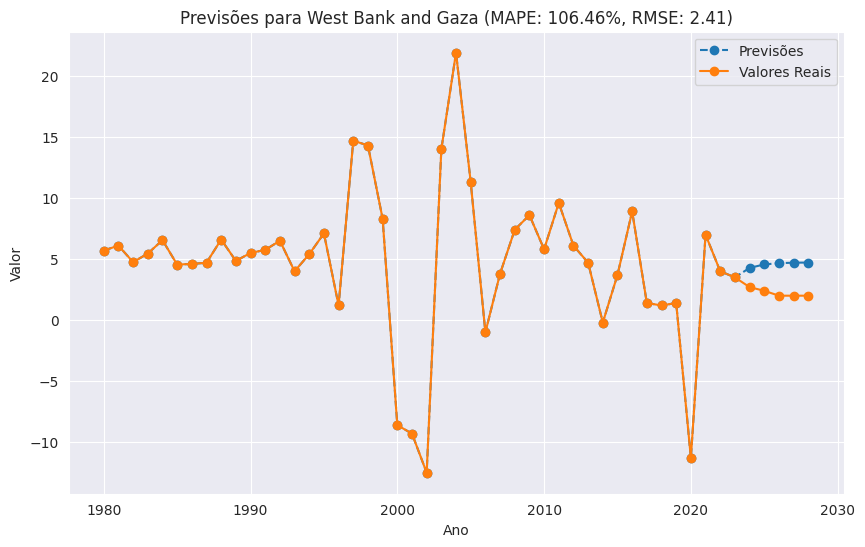

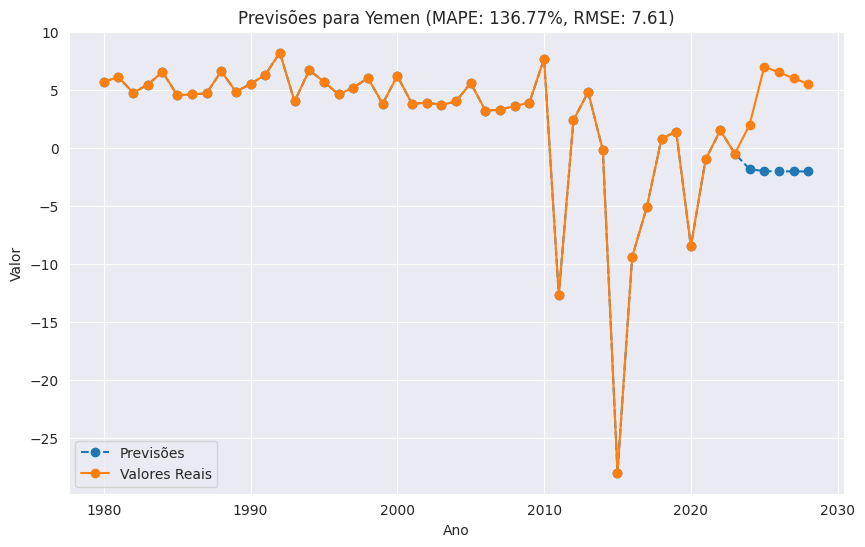

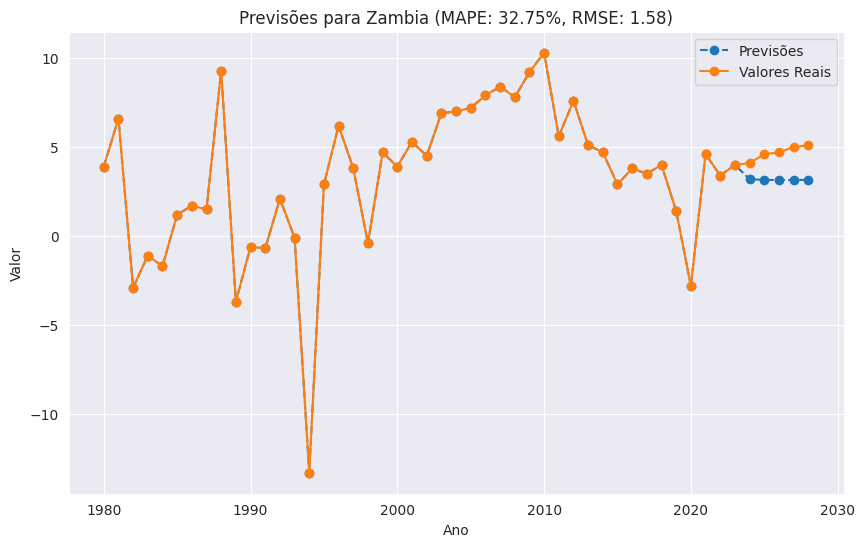

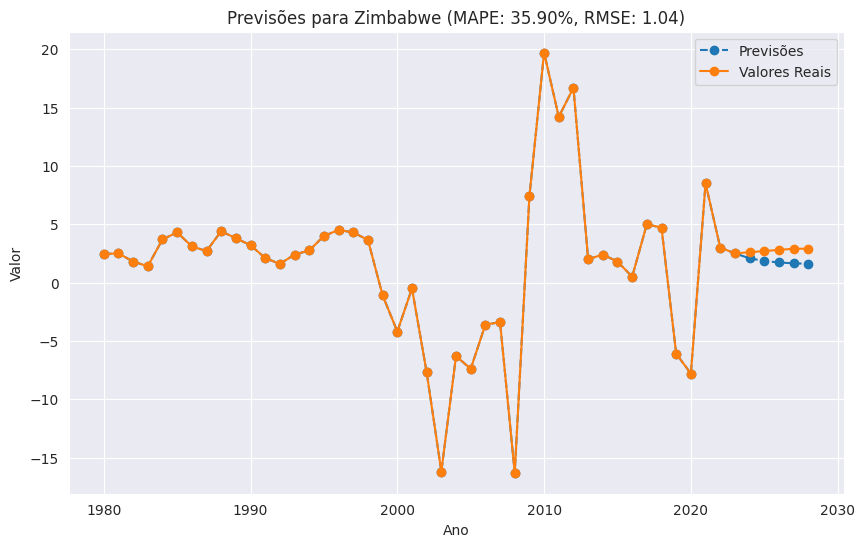

Média MAPE: 37.61%, Média RMSE: 1.48


,Country,2024_prediction,2025_prediction,2026_prediction,2027_prediction,2028_prediction
0,Afghanistan,3.706725,3.594474,3.655426,3.622329,3.640301
1,Albania,2.609905,2.748277,2.794988,2.810756,2.816079
2,Algeria,2.438276,2.378821,2.356963,2.348928,2.345973
3,Andorra,1.812405,1.999213,2.067318,2.092147,2.101199
4,Angola,2.645963,2.266203,2.097338,2.022249,1.988860
...,...,...,...,...,...,...
191,Vietnam,3.530740,4.438902,4.075454,4.220906,4.162696
192,West Bank and Gaza,4.275841,4.559890,4.663885,4.701960,4.715900
193,Yemen,-1.834050,-2.005655,-2.027730,-2.030569,-2.030934
194,Zambia,3.195851,3.153684,3.151473,3.151357,3.151351


In [99]:
# Seu DataFrame de dados
df = df_pivoted.copy()

# Função para fazer previsões ARIMA
def arima_forecast(data, p, d, q):
    # Dividir os dados em treinamento e teste
    train = data.loc[:, 1980:2023]
    test = data.loc[:, 2024:2028]

    forecasts = []
    mape_scores = []
    rmse_scores = []

    for index, row in data.iterrows():
        country = row['Country']
        train_series = np.array(train.loc[index, :])
        test_series = np.array(test.loc[index, :])

        # Treinar o modelo ARIMA com os parâmetros especificados
        arima_model = ARIMA(train_series, order=(p, d, q))
        arima_model_fit = arima_model.fit()

        # Fazer previsões
        forecast = arima_model_fit.forecast(steps=len(test_series))

        # Calcular MAPE e RMSE
        mape = mean_absolute_error(test_series, forecast) / np.mean(np.abs(test_series)) * 100
        rmse = np.sqrt(mean_squared_error(test_series, forecast))

        forecasts.append(forecast)
        mape_scores.append(mape)
        rmse_scores.append(rmse)

        # Plotar gráfico para o país
        plt.figure(figsize=(10, 6))
        plt.plot(range(1980, 2029), np.concatenate((train_series, forecast)), marker='o', linestyle='--', label='Previsões')
        plt.plot(range(1980, 2029), np.concatenate((train_series, test_series)), marker='o', label='Valores Reais')
        plt.title(f'Previsões para {country} (MAPE: {mape:.2f}%, RMSE: {rmse:.2f})')
        plt.xlabel('Ano')
        plt.ylabel('Valor')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Calcular a média do MAPE e RMSE
    mean_mape = np.mean(mape_scores)
    mean_rmse = np.mean(rmse_scores)

    print(f'Média MAPE: {mean_mape:.2f}%, Média RMSE: {mean_rmse:.2f}')

    return forecasts, mean_mape, mean_rmse

# Definir os parâmetros do modelo ARIMA (p, d, q)
p = 1  # Ordem do componente autoregressivo
d = 1  # Ordem de diferenciação
q = 1  # Ordem do componente de média móvel

forecasts, _, _ = arima_forecast(df, p, d, q)

# Criar um DataFrame com as previsões
years = ['2024_prediction', '2025_prediction', '2026_prediction', '2027_prediction', '2028_prediction']
forecast_df = pd.DataFrame(forecasts, columns=years)

# Adicionar a coluna 'Country' ao DataFrame de previsões
forecast_df['Country'] = df['Country']

# Reorganizar as colunas para ter 'Country' como a primeira coluna
forecast_df = forecast_df[['Country'] + years]

forecast_df.to_csv('forecast_df.csv', index=False)

# Exibir o DataFrame de previsões
forecast_df


###**6.3 Retirando os anos de 2009 e 2020 ( Recessão e Pandemia) e observando os resultados**

In [100]:
data_no_09_20 = df_pivoted.copy()

# Remove as colunas correspondentes aos anos de 2009 e 2020
data_no_09_20 = data_no_09_20.drop(columns=[2009, 2020])

In [101]:
df = data_no_09_20.copy()

# Função para fazer previsões ARIMA
def arima_forecast(data, p, d, q):
    # Dividir os dados em treinamento e teste
    train = data.loc[:, 1980:2023]
    test = data.loc[:, 2024:2028]

    forecasts = []
    mape_scores = []
    rmse_scores = []

    for index, row in data.iterrows():
        country = row['Country']
        train_series = np.array(train.loc[index, :])
        test_series = np.array(test.loc[index, :])

        # Treinar o modelo ARIMA com os parâmetros especificados
        arima_model = ARIMA(train_series, order=(p, d, q))
        arima_model_fit = arima_model.fit()

        # Fazer previsões
        forecast = arima_model_fit.forecast(steps=len(test_series))

        # Calcular MAPE e RMSE
        mape = mean_absolute_error(test_series, forecast) / np.mean(np.abs(test_series)) * 100
        rmse = np.sqrt(mean_squared_error(test_series, forecast))

        forecasts.append(forecast)
        mape_scores.append(mape)
        rmse_scores.append(rmse)


    # Calcular a média do MAPE e RMSE
    mean_mape = np.mean(mape_scores)
    mean_rmse = np.mean(rmse_scores)

    print(f'Média MAPE: {mean_mape:.2f}%, Média RMSE: {mean_rmse:.2f}')

    return forecasts, mean_mape, mean_rmse

# Definir os parâmetros do modelo ARIMA (p, d, q)
p = 1  # Ordem do componente autoregressivo
d = 1  # Ordem de diferenciação
q = 1  # Ordem do componente de média móvel

forecasts, _, _ = arima_forecast(df, p, d, q)

# Criar um DataFrame com as previsões
years = ['2024_prediction', '2025_prediction', '2026_prediction', '2027_prediction', '2028_prediction']
forecast_df = pd.DataFrame(forecasts, columns=years)

# Adicionar a coluna 'Country' ao DataFrame de previsões
forecast_df['Country'] = df['Country']

# Reorganizar as colunas para ter 'Country' como a primeira coluna
forecast_df = forecast_df[['Country'] + years]

forecast_df.to_csv('forecast_df.csv', index=False)

# Exibir o DataFrame de previsões
forecast_df

Média MAPE: 45.02%, Média RMSE: 1.56


,Country,2024_prediction,2025_prediction,2026_prediction,2027_prediction,2028_prediction
0,Afghanistan,4.162858,3.692876,4.026105,3.789838,3.957357
1,Albania,2.681417,2.854211,2.916231,2.938492,2.946483
2,Algeria,2.542728,2.517588,2.506553,2.501709,2.499582
3,Andorra,1.791216,2.092488,2.277264,2.390590,2.460096
4,Angola,4.088842,4.454103,4.680675,4.821219,4.908398
...,...,...,...,...,...,...
191,Vietnam,6.107340,6.252234,6.320542,6.352746,6.367928
192,West Bank and Gaza,3.575081,3.559461,3.562710,3.562034,3.562175
193,Yemen,-1.287593,-1.429875,-1.455578,-1.460222,-1.461061
194,Zambia,3.820014,3.812606,3.812301,3.812288,3.812287


#**Conclusões**

##**Desempenho do Modelo ARIMA**

Foi realizado um estudo de previsão de séries temporais utilizando o modelo ARIMA (AutoRegressive Integrated Moving Average).

**Configuração do Modelo:**

Modelo: **ARIMA**

Métrica de Avaliação: **MAPE (Mean Absolute Percentage Error)**

**Resultado:**

A média de MAPE obtida para as previsões utilizando o modelo ARIMA foi de 37%.

**Observações:**



*   O modelo ARIMA foi escolhido devido à sua capacidade de lidar com séries temporais univariadas e à otimização automática de parâmetros.
*   O MAPE é uma métrica comumente usada para avaliar o desempenho de modelos de previsão, representando a porcentagem média de erro absoluto em relação aos valores reais.
*   O valor de MAPE de 37% indica que, em média, as previsões do modelo ARIMA têm um erro absoluto médio de 37% em relação aos valores reais.  

Este resultado fornece uma avaliação do desempenho do modelo ARIMA em suas previsões e pode ser usado para tomar decisões informadas sobre sua utilidade em cenários específicos.

Além do resultado do MAPE, é importante analisar o desempenho do modelo ARIMA por meio dos gráficos gerados. Abaixo estão algumas observações sobre o resultado dos gráficos obtidos:

1.   **Comparação Visual:** Os gráficos de previsão versus valores reais permitem uma comparação visual direta do desempenho do modelo. Se as previsões estiverem bem alinhadas com os valores reais, isso é um indicativo positivo do modelo.
2.   **Tendências e Sazonalidade:** Ao observar os gráficos, é importante verificar se o modelo ARIMA capturou com precisão as tendências e sazonalidades nos dados. Isso é crucial para fazer previsões precisas.
3.  **Erros e Discrepâncias:** Em alguns casos, é possível observar discrepâncias significativas entre as previsões e os valores reais. Essas discrepâncias podem ser áreas de melhoria no modelo. É importante examinar essas áreas com cuidado para entender a causa das diferenças.
4.  **Variações ao Longo do Tempo**: Os gráficos podem mostrar se o desempenho do modelo é consistente ao longo do tempo ou se há variações significativas em diferentes períodos. Essa análise ajuda a identificar se o modelo é mais eficaz em determinadas condições ou períodos.
5.  **Impacto do MAPE:** O MAPE, como mencionado, fornece uma métrica quantitativa do desempenho médio do modelo. É útil para resumir o erro médio em uma única medida, mas também é importante considerar como esse erro se distribui ao longo do tempo.

Lembrando que o MAPE de 37% indica um erro médio absoluto de 37% em relação aos valores reais. Isso pode ser considerado alto ou baixo dependendo do contexto específico da aplicação e das expectativas de precisão.

Portanto, além do MAPE, a análise visual dos gráficos é fundamental para avaliar a capacidade do modelo ARIMA de fornecer previsões precisas e identificar possíveis áreas de melhoria ou ajuste do modelo.

Em conclusão, a previsão do índice de Produto Interno Bruto (PIB) é uma tarefa crucial para muitos setores, incluindo negócios, governo e finanças. Embora tenhamos explorado a utilização do modelo ARIMA como uma ferramenta valiosa para esse propósito, é importante reconhecer que há espaço para melhorias significativas na precisão das previsões.

Um estudo mais aprofundado no futuro pode ser extremamente benéfico para aprimorar o desempenho do modelo ARIMA. Isso envolveria a consideração de vários aspectos, incluindo:

1.  **Dados de alta qualidade:** Certificar-se de que os dados utilizados para a modelagem são precisos e atualizados é fundamental. Qualquer erro ou falta de dados pode afetar drasticamente a acuracidade das previsões.

2.  **Tratamento de outliers robusto:**A detecção e tratamento adequado de outliers são essenciais. Explorar métodos mais avançados, como o uso de modelos robustos, pode ajudar a lidar com valores discrepantes de maneira mais eficaz.

3.  **Imputação de dados:** A imputação de dados ausentes ou inconsistentes é um desafio comum em análises de séries temporais. Considere abordagens mais sofisticadas para imputação, como a utilização de técnicas de aprendizado de máquina, para melhorar a integridade dos dados.

4.  **Seleção de características:** Avaliar se todas as variáveis utilizadas na modelagem são relevantes e contribuem efetivamente para a precisão das previsões. A seleção de características pode simplificar o modelo e reduzir o risco de overfitting.

5.  **Experimentação com outros modelos:** Além do ARIMA, considere explorar outros modelos de séries temporais, como modelos de médias móveis exponenciais (EMA), modelos de suavização exponencial, ou mesmo técnicas de aprendizado de máquina, como redes neurais, para ver se eles oferecem desempenho superior em suas previsões.

6.  **Avaliação contínua:** Monitorar regularmente o desempenho do modelo e ajustá-lo conforme necessário à medida que mais dados se tornam disponíveis ou à medida que as condições econômicas mudam.

Em suma, enquanto o modelo ARIMA é um ponto de partida valioso para prever o índice de PIB, um esforço contínuo para aprimorar sua precisão é essencial. Isso pode ser alcançado por meio de um estudo mais profundo dos dados, um tratamento de outliers mais robusto, aprimoramento na imputação de dados e a consideração de outros modelos de previsão. Com essas melhorias, você estará mais bem preparado para tomar decisões informadas e estratégicas em relação às tendências econômicas futuras.

#**Links:**


*   https://analisemacro.com.br/data-science/python/estacionariedade_series_temporais/#:~:text=Caso%203%3A%20KPSS%20indica%20estacionariedade,a%20nova%20s%C3%A9rie%20%C3%A9%20estacion%C3%A1ria.
*   http://leg.ufpr.br/~lucambio/STemporais/STemporaisIII.html
*   https://medium.com/analytics-vidhya/time-series-forecasting-a-complete-guide-d963142da33f



